In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import scipy.signal as sig
import xml.etree.ElementTree as et
import time

import matplotlib.patches as patches

%matplotlib inline

In [2]:
IMAGE_EXTENSION = ".tif"
FILE_EXTENSION = ".xml"

NS_PAGE = "http://schema.primaresearch.org/PAGE/gts/pagecontent/2019-07-15"
NS_XSI = "http://www.w3.org/2001/XMLSchema-instance"
SCHEMA = "http://schema.primaresearch.org/PAGE/gts/pagecontent/2019-07-15 " + \
        "http://schema.primaresearch.org/PAGE/gts/pagecontent/2019-07-15/" + \
        "pagecontent.xsd"

RESULTS_FILE = "time.csv"

ROOT_TAG = "{" + NS_PAGE + "}PcGts"
PAGE_TAG = "{" + NS_PAGE + "}Page"
TEXT_REGION_TAG = "{" + NS_PAGE + "}TextRegion"
TEXT_LINE_TAG = "{" + NS_PAGE + "}TextLine"
COORDS_TAG = "{" + NS_PAGE + "}Coords"
SCHEMA_LOCATION_ATTR ="{" + NS_XSI + "}schemaLocation"

In [3]:
def troughFind(img):
    #img = cv.imread(image, 0)
    sumMatrix = np.sum(255 - img, 1)

    smooth = sig.savgol_filter(sumMatrix, 51, 3)
    smooth = sig.savgol_filter(smooth, 51, 3)
    smooth = sig.savgol_filter(smooth, 51, 3)
    #smooth = sig.savgol_filter(smooth, 51, 3)

    troughs, _ = sig.find_peaks(-smooth)

    return troughs

In [4]:
def find_closest(target, arr):
    left = 0
    right = len(arr) - 1
    
    if len(arr) < 1:
        return 0
    
    if target >= arr[right]:
        return right
    if target <= arr[left]:
        return left
    
    while(left < right):
        mid = (left + right) // 2
        if target < arr[mid]:
            right = mid
        elif target > arr[mid]:
            left = mid + 1
        else:
            return mid
    if target < arr[mid]:
        return mid if abs(target - arr[mid]) <= abs(target - arr[mid-1]) else mid-1
    else:
        return mid if abs(target - arr[mid]) <= abs(target - arr[mid+1]) else mid+1

In [5]:
def find_intersect(start_1, end_1, start_2, end_2):
    if end_1 < start_2 or end_2 < start_1:
        return 0
    
    intersect_start = start_1
    if start_2 > start_1:
        intersect_start = start_2
    
    intersect_end = end_1
    if end_1 > end_2:
        intersect_end = end_2
        
    return abs(intersect_end - intersect_start)

In [6]:
def find_union(start_1, end_1, start_2, end_2):
    union_start = start_1
    if start_2 < start_1:
        union_start = start_2
    
    union_end = end_1
    if end_1 < end_2:
        union_end = end_2
        
    return abs(union_end - union_start)

In [7]:
def padding(first, last, img_length):
    pad = 20
    new_first = first - pad
    if new_first < 0:
        new_first = 0
    new_last = last + pad
    if new_last > img_length:
        new_last = img_length
        
    return new_first, new_last

anon_11951455_51440_96height_atreatiseofdirection-042_page2r.tif
short: 33777954
long: 73478376


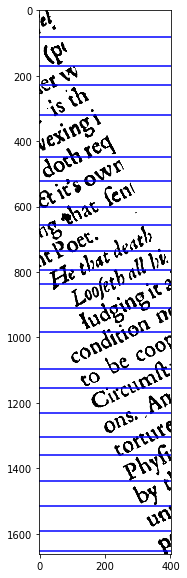

22
divandphil-015_page1r.tif
short: 25962429
long: 199097602


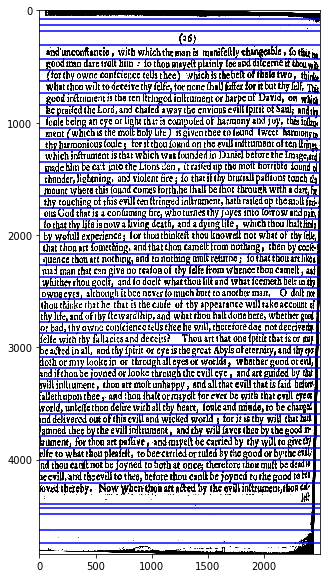

47
anatomist-002_page2r.tif
short: 9601931
long: 53830697


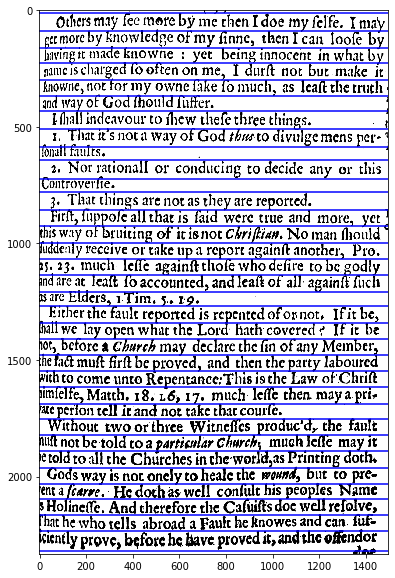

34
anon_xxxxx_yyyyy_130height_christianitynot-165_page1r.tif
short: 10170410
long: 53603744


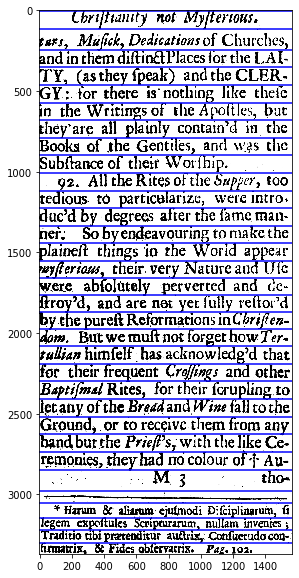

32
bloudytenent-018_page2r.tif
short: 8286532
long: 80518175


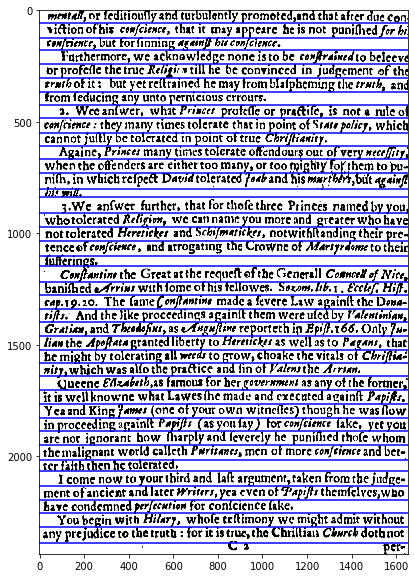

39
paine_44920427_173874_112height_sincereconvert-145_page2r.tif
short: 8749053
long: 35025296


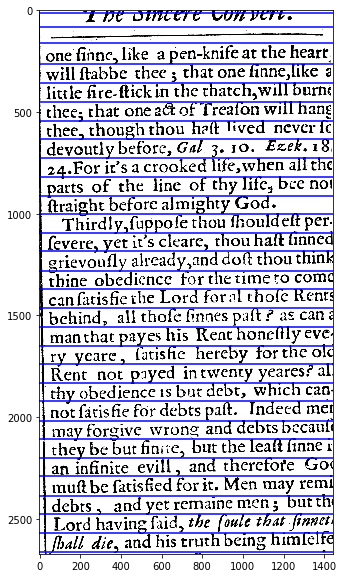

30
a.coe_99835820_45_108height_younghorseman-023_page2r.tif
short: 13612219
long: 40129601


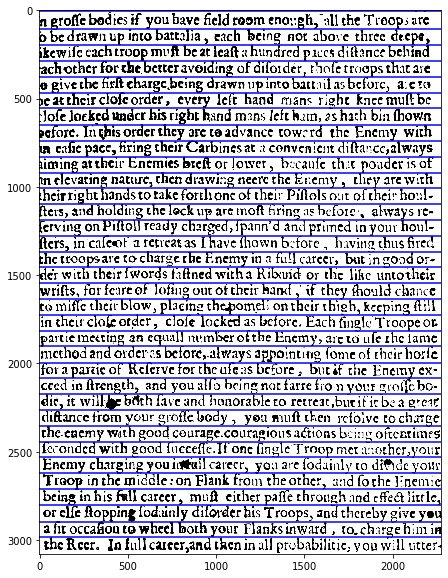

34
paine_44920427_173874_112height_sincereconvert-066_page1r.tif
short: 10436254
long: 60614559


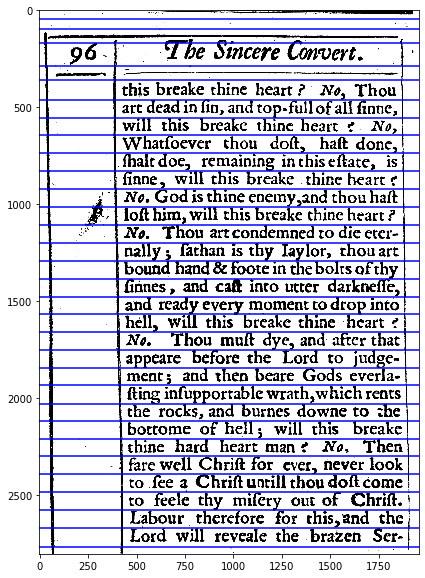

31
colasterion-010_page1r.tif
short: 23698032
long: 127308539


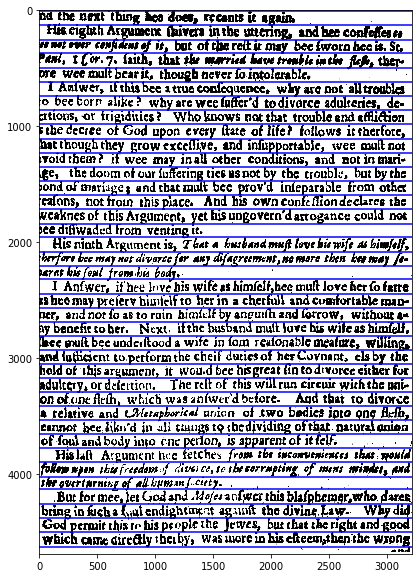

39
allde_99847664_12716_61height_bondman-010_page2r.tif
short: 11631119
long: 213316934


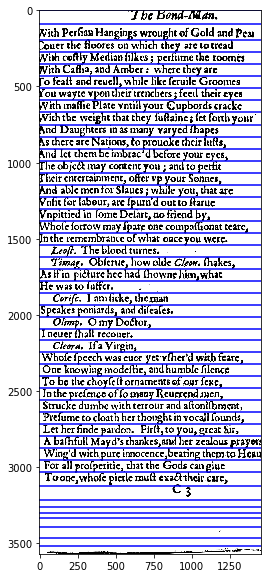

47
churchgovernment2-027_page2r.tif
short: 8688671
long: 31337518


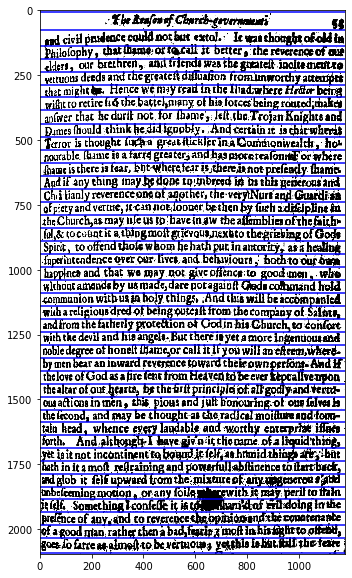

42
paine_44920427_173874_112height_sincereconvert-059_page2r.tif
short: 8670777
long: 20295094


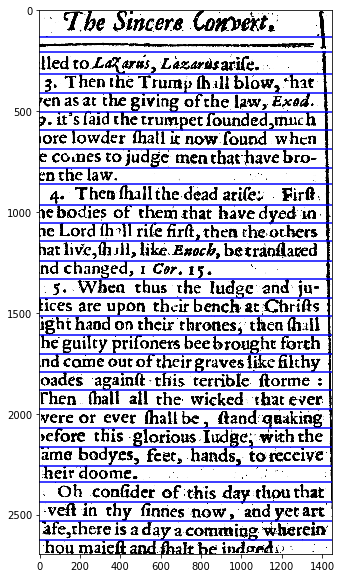

28
cotes_11998072_196646_83height_allegiancenot-000_page1r.tif
short: 8090205
long: 149158475


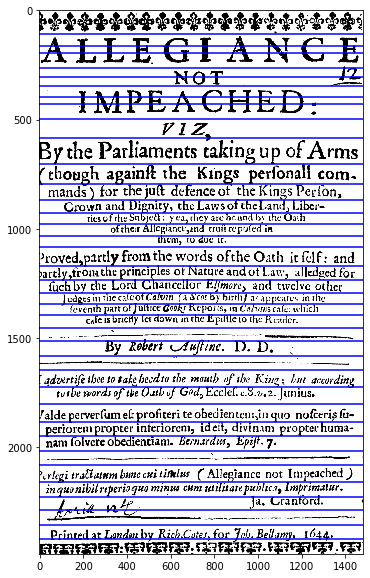

37
anon_xxxxx_yyyyy_130height_christianitynot-086_page1r.tif
short: 10246000
long: 28267229


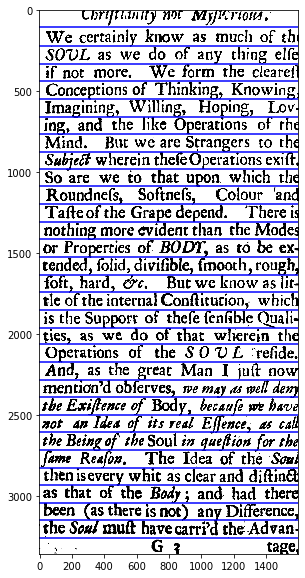

30
allde_56572951_181049_106height_logarithmes230637-027_page1r.tif
short: 4813363
long: 30497262


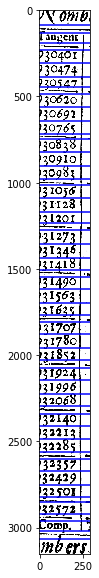

48
allde_56572951_181049_106height_logarithmes230637-026_page1r.tif
short: 5553672
long: 21219194


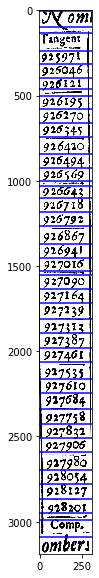

40
painesimmons_13031279_96743_68height_thetrueoriginal-153_page1r.tif
short: 5717998
long: 36528483


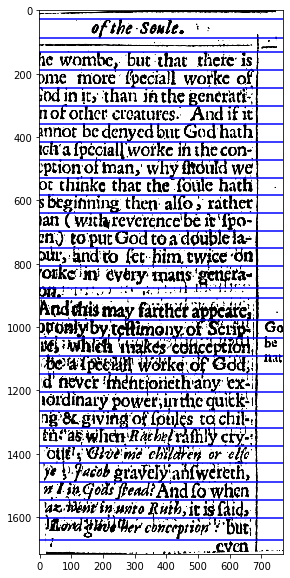

30
presbyteries-144_page2r.tif
short: 8199099
long: 120578412


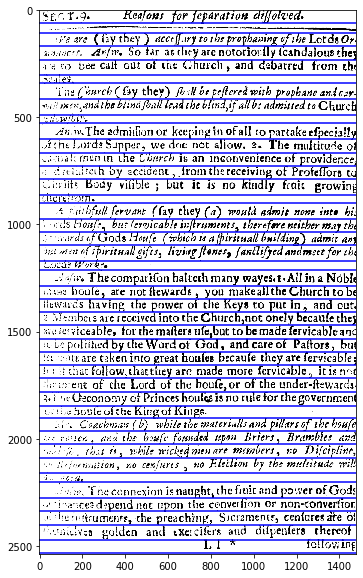

41
bloudytenent-049_page2r.tif
short: 8298544
long: 89586668


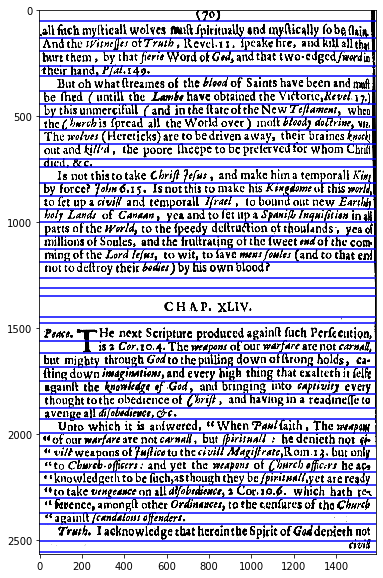

41
anexactrelation1-002_page2r.tif
short: 8690994
long: 48001397


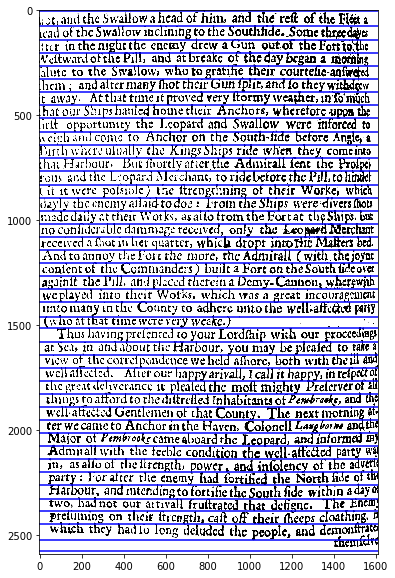

42
paine_44920427_173874_112height_sincereconvert-135_page1r.tif
short: 9107701
long: 19961332


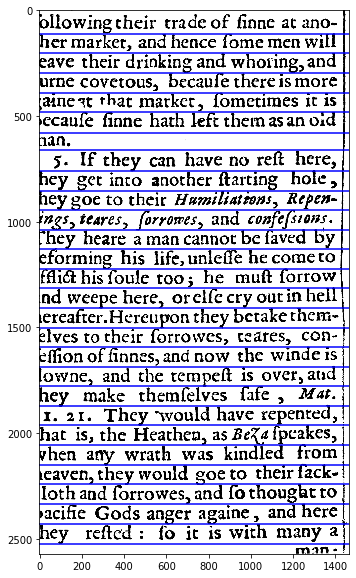

27
presbyteries-104_page1r.tif
short: 8554921
long: 118550493


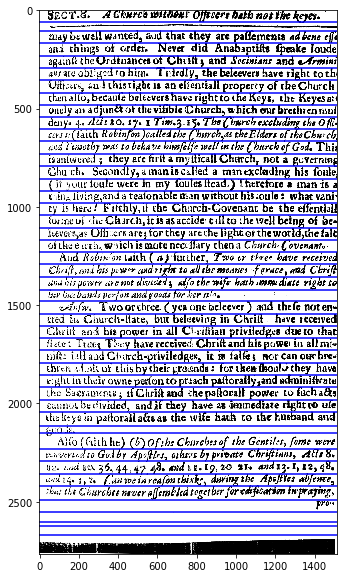

44
churchgovernment2-007_page2r.tif
short: 6469427
long: 64842067


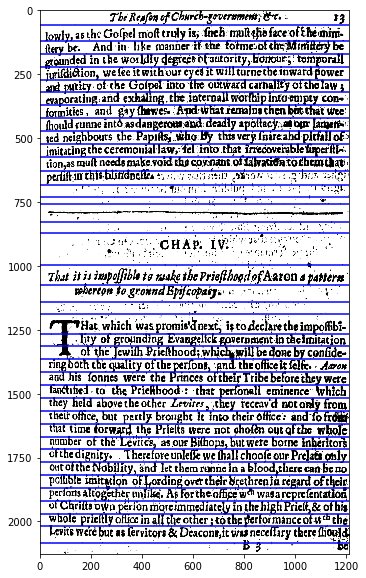

38
cotes_11998072_196646_83height_allegiancenot-007_page1r.tif
short: 8627796
long: 53098629


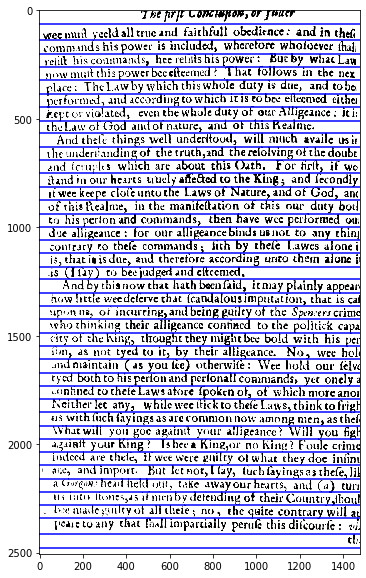

40
presbyteries-194_page2r.tif
short: 7886536
long: 58637874


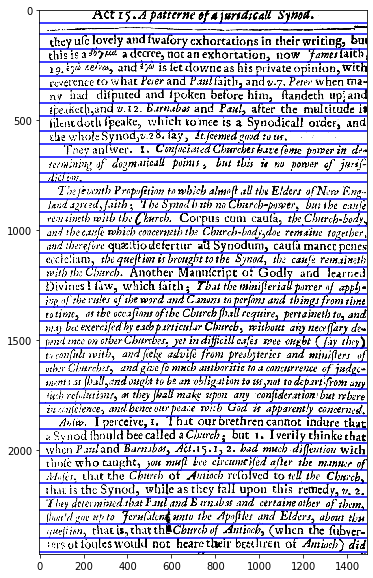

40
allde_99857682_23451_113height_aprilshower-006_page2r.tif
short: 5712588
long: 67037175


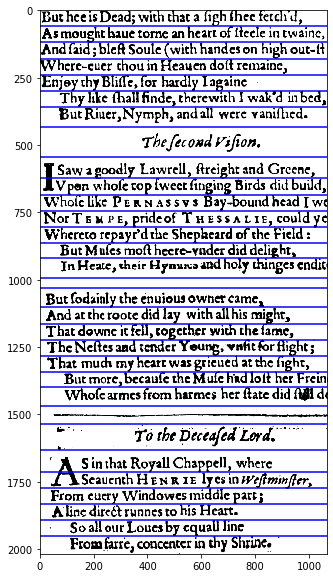

30
anon_xxxxx_yyyyy_130height_christianitynot-007_page1r.tif
short: 8452299
long: 125994172


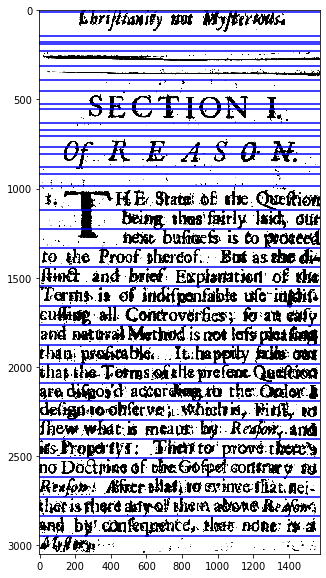

36
presbyteries-391_page1r.tif
short: 7539800
long: 91725288


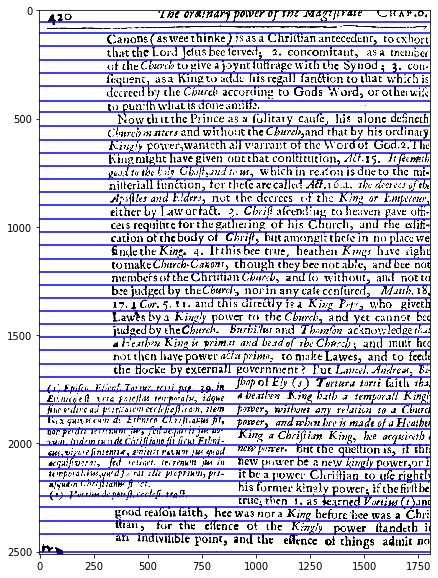

41
presbyteries-100_page1r.tif
short: 6267381
long: 81574255


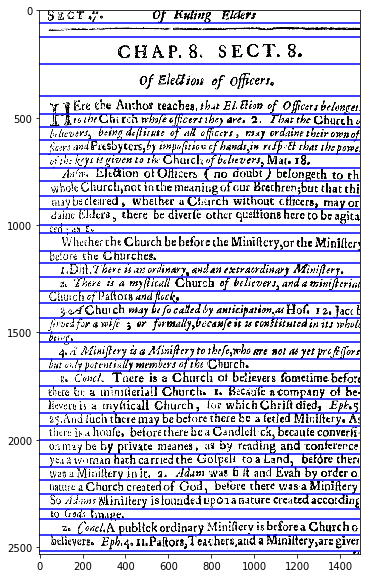

37
bloudytenent-106_page1r.tif
short: 6697532
long: 50667541


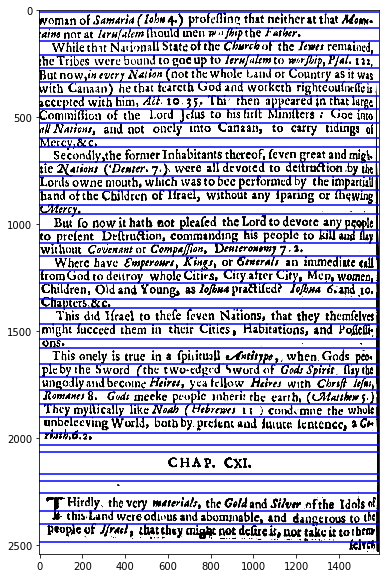

40
painesimmons_12282228_197705_73height_argumentordebate-005_page1r.tif
short: 7099351
long: 39743058


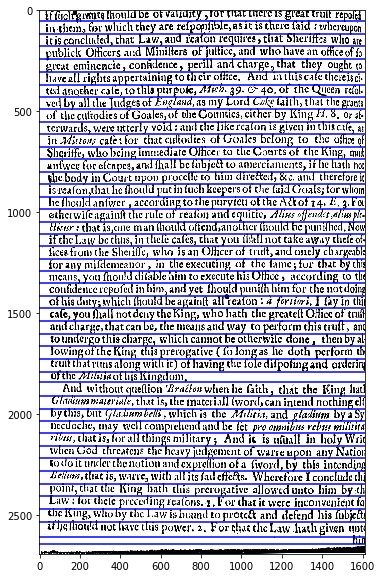

43
poems-056_page1r.tif
short: 6475288
long: 26520455


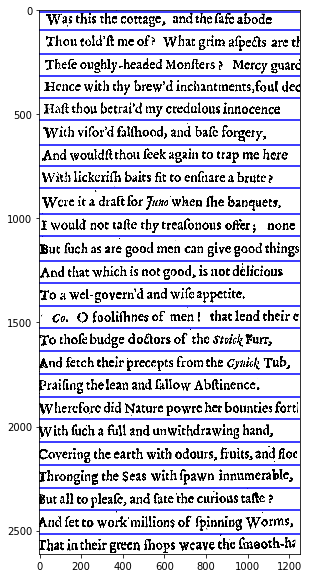

24
dugard_99832850_37325_71height_eikon-176_page2r.tif
short: 5119233
long: 50210119


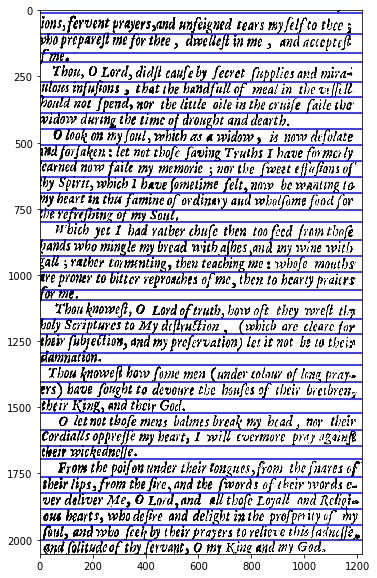

34
leviathanC-009_page2r.tif
short: 6494284
long: 50878093


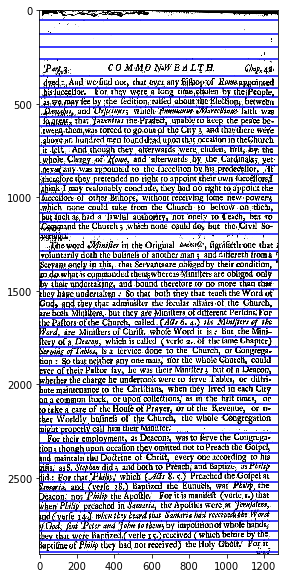

53
anon_99861022_113149_140height_christiansliberty-002_page1r.tif
short: 5762130
long: 81939172


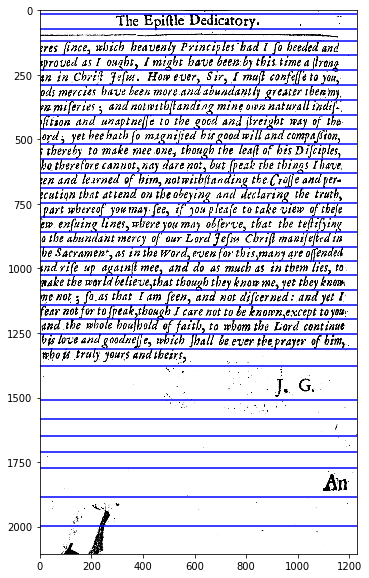

32
a.coe_12062134_196557_86height_checktothechecker-003_page1r.tif
short: 6156394
long: 51053960


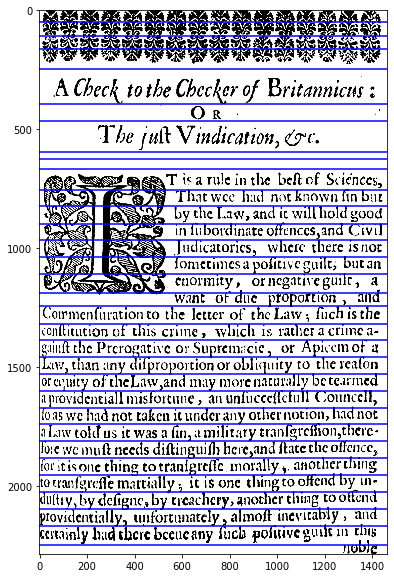

31
oultondexter_11976267_51786_87height_discoursetoprovebap-018_page2r.tif
short: 9234086
long: 50267165


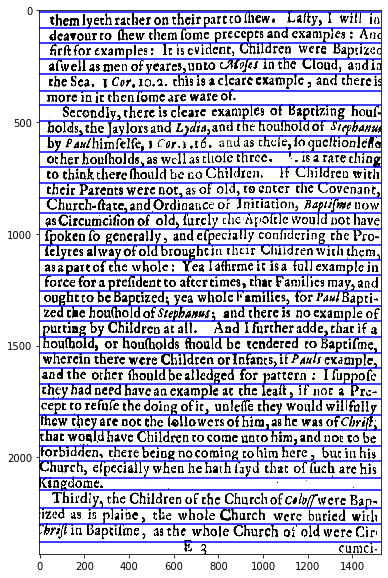

35
divandphil-029_page2r.tif
short: 16217239
long: 71416156


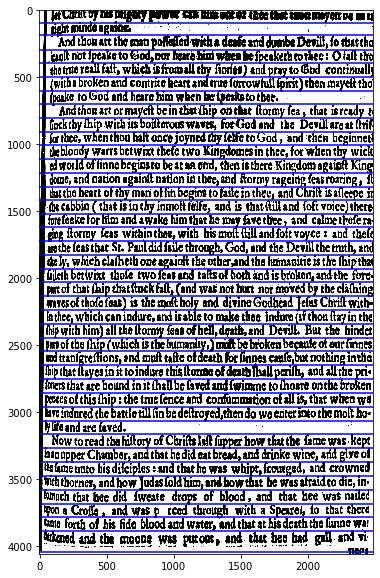

39
paine_99836404_177063_124height_meditationsanddisquisitions-057_page2r.tif
short: 10516012
long: 46221461


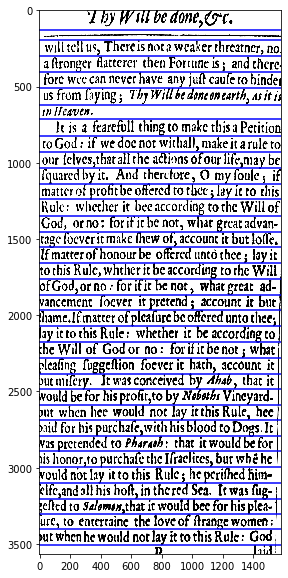

34
anon_45578517_172428_84height_bloudytenent2759G-005_page1r.tif
short: 9214038
long: 82760210


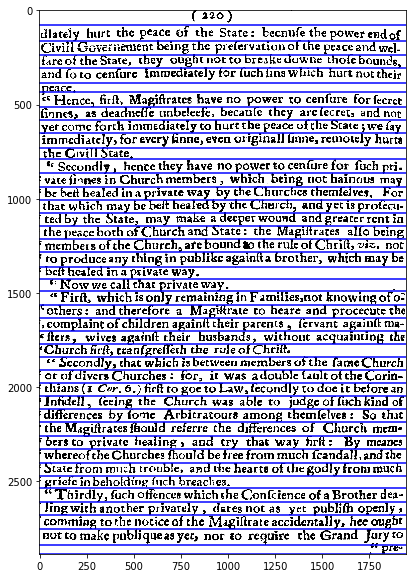

41
adialogue-027_page1r.tif
short: 6876175
long: 57813306


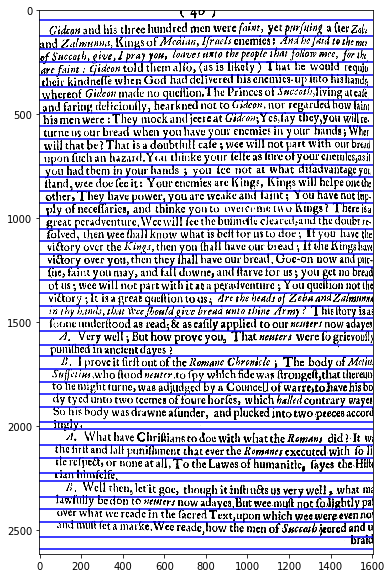

42
leviathanA-039_page2r.tif
short: 6525511
long: 55225907


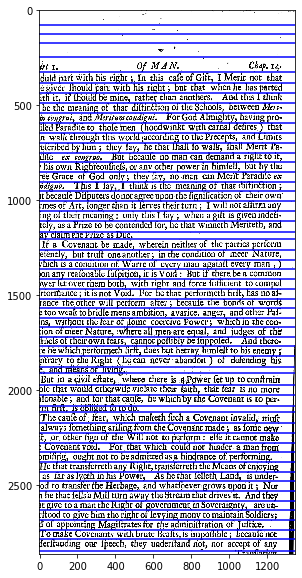

54
bloudytenent-055_page2r.tif
short: 7705649
long: 87913766


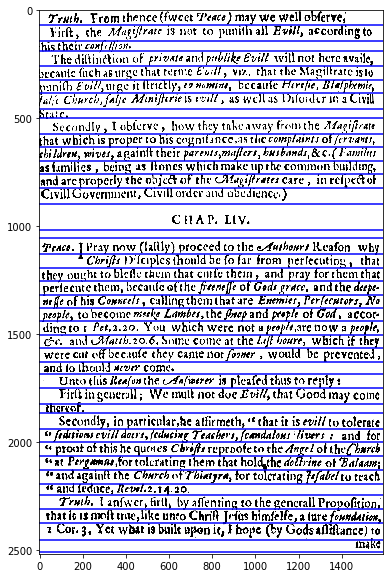

39
divandphil-019_page1r.tif
short: 15203471
long: 117422885


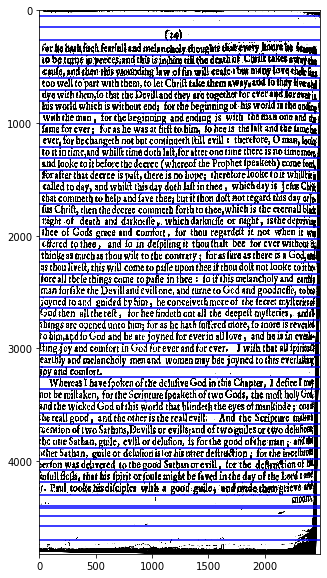

47
painesimmons-047_page1r.tif
short: 5881192
long: 45969410


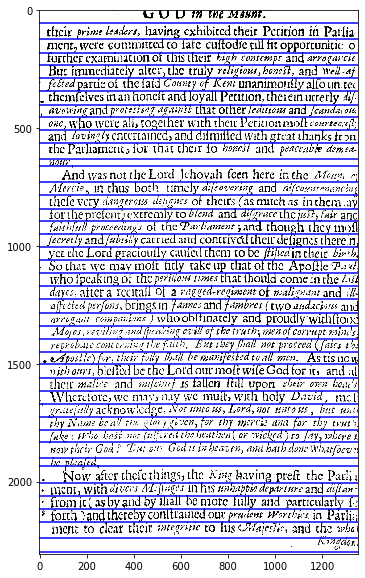

41
leviathanA-065_page1r.tif
short: 6568661
long: 86933559


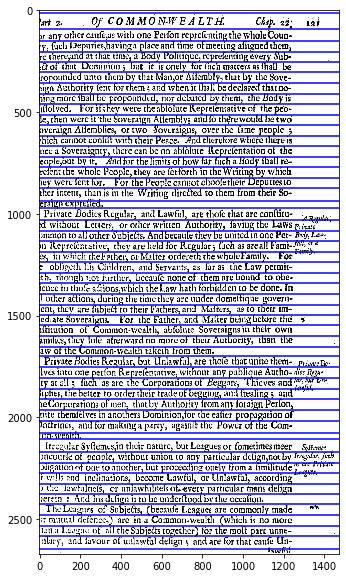

51
presbyteries-017_page2r.tif
short: 6407411
long: 33935080


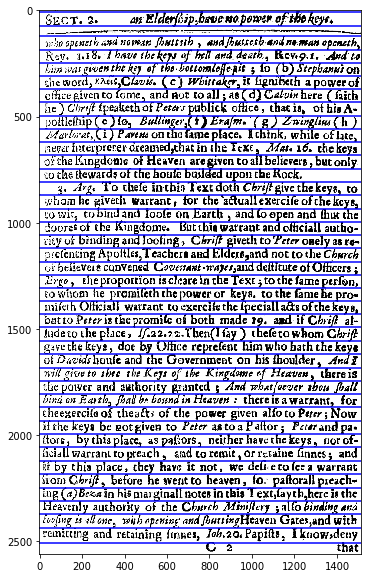

41
churchgovernment2-026_page1r.tif
short: 5392181
long: 18009085


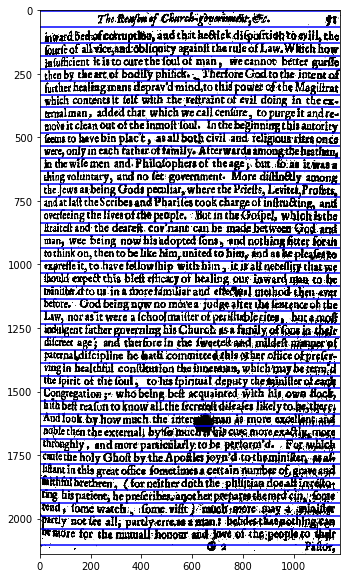

42
dugard_99832850_37325_71height_eikon-115_page2r.tif
short: 5373265
long: 45841752


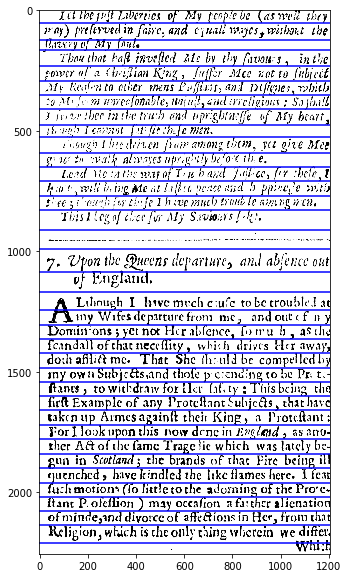

35
anon_45578517_172428_84height_bloudytenent2759F-003_page1r.tif
short: 12840781
long: 128521370


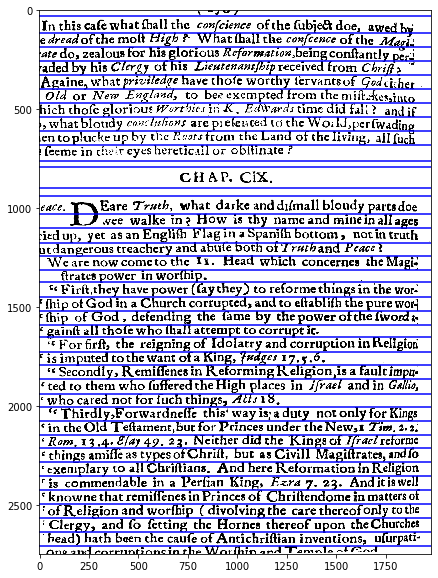

39
cotes_11901410_50587_53height_thepathway-028_page2r.tif
short: 7512389
long: 40399067


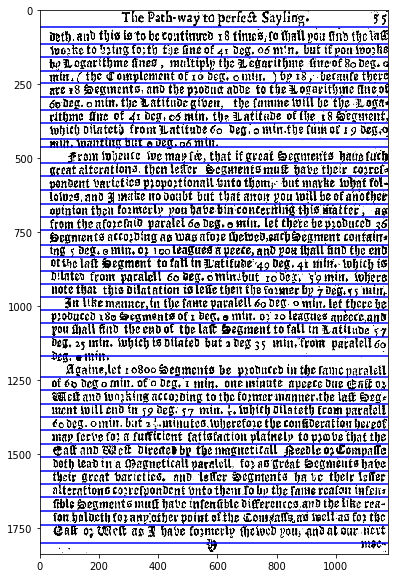

38
leviathanC-015_page1r.tif
short: 8603570
long: 106374168


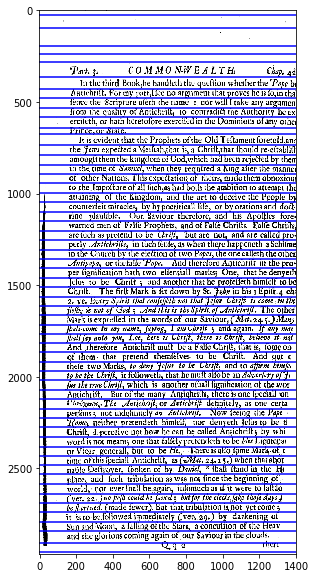

56
anon_11951455_51440_96height_atreatiseofdirection-070_page2r.tif
short: 5097202
long: 12306767


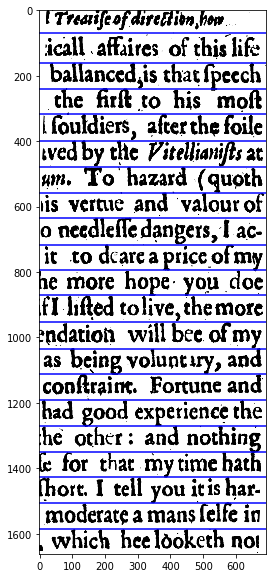

20
poems-005_page2r.tif
short: 6515452
long: 59871185


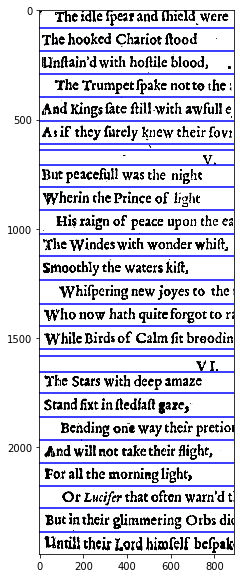

25
oultondexter_99873267_156588_74height_certainobservations-008_page1r.tif
short: 8807570
long: 99795447


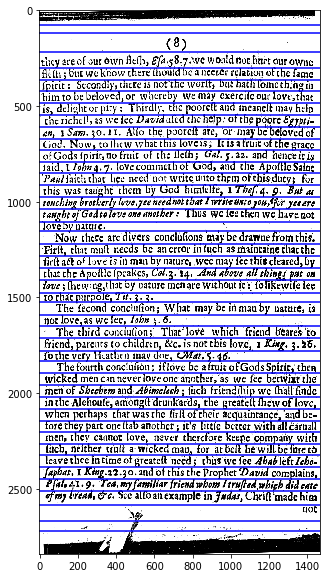

43
anon_14574607_102630_86height_compsam1ed-010_page2r.tif
short: 5369589
long: 20935213


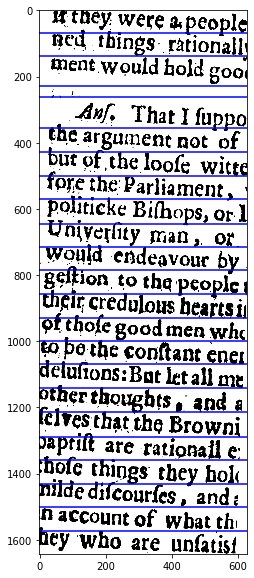

22
allde_99898377_173459_98height_logarithmes230643-007_page1r.tif
short: 5966059
long: 28251607


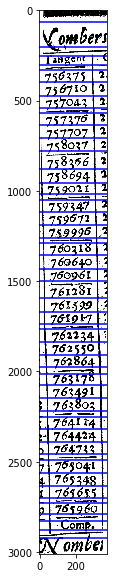

47
dugard_99832850_37325_71height_eikon-170_page2r.tif
short: 6846169
long: 65544329


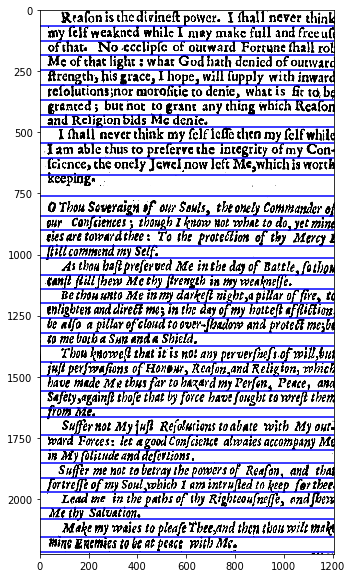

36
painesimmons_12302829_59172_68height_remedieofschisme-002_page2r.tif
short: 6910238
long: 43392280


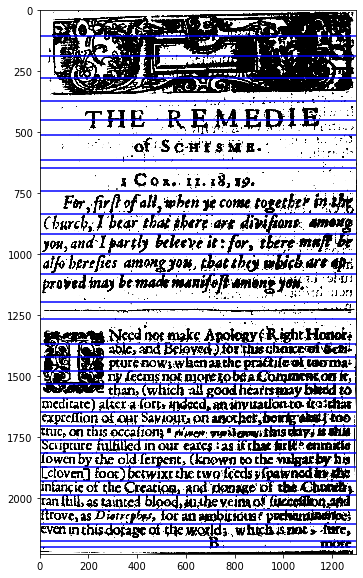

31
painesimmons_12302829_59172_68height_remedieofschisme-003_page1r.tif
short: 9530627
long: 40071977


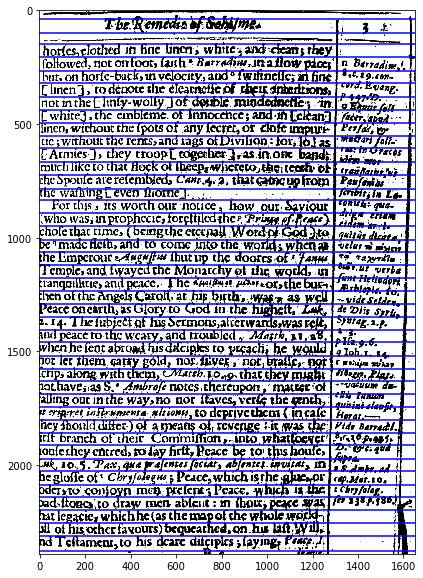

42
paine_99836404_177063_124height_meditationsanddisquisitions-001_page1r.tif
short: 10844133
long: 96352836


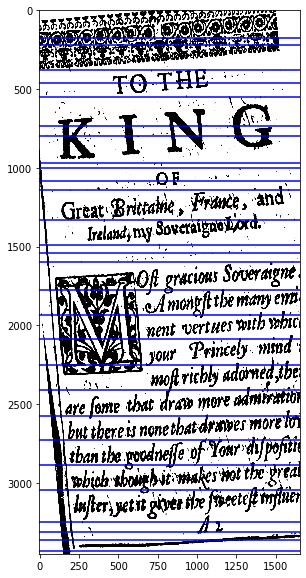

28
allde_99850276_15466_119height_briefecatechisme-015_page1r.tif
short: 8907808
long: 41559697


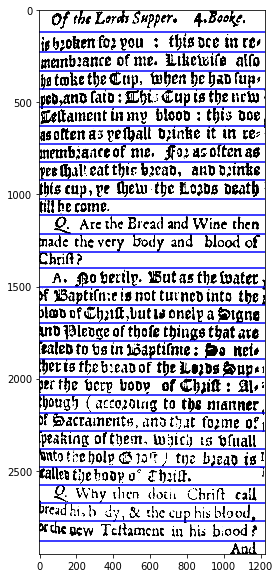

29
poems-005_page1r.tif
short: 7148170
long: 77356433


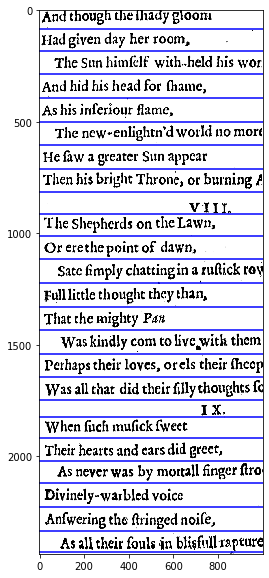

24
painesimmons_99854747_20190_83height_seamansdirection-021_page2r.tif
short: 5701006
long: 13111664


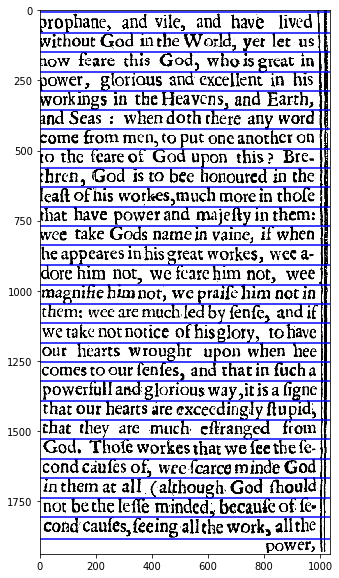

28
a.coe_99825981_207068_110height_briefandplaincatechisme-011_page2r.tif
short: 7246193
long: 38463722


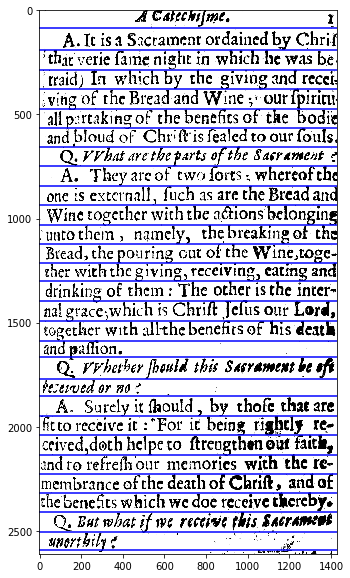

28
a.coe_12219704_56371_95height_saintssolemne-019_page2r.tif
short: 7362830
long: 44351004


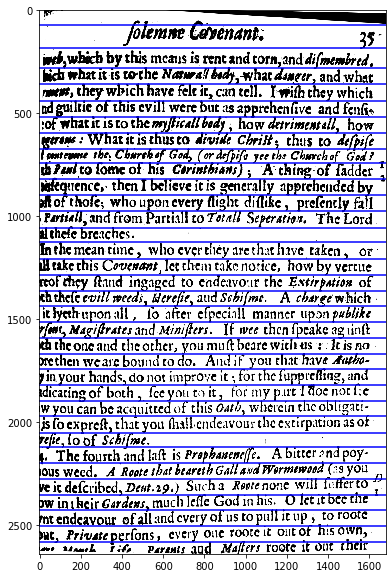

33
painesimmons_13031279_96743_68height_thetrueoriginal-115_page1r.tif
short: 6311122
long: 24904804


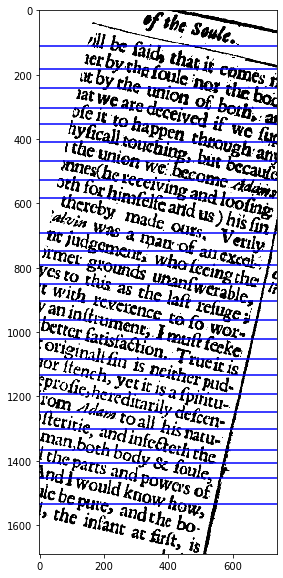

25
j.coe_12369005_60502_68height_eccehomo-010_page2r.tif
short: 3782663
long: 12329037


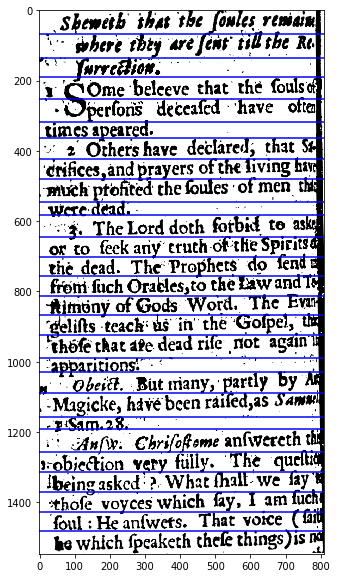

26
paine_99836404_177063_124height_meditationsanddisquisitions-083_page1r.tif
short: 8510056
long: 21729431


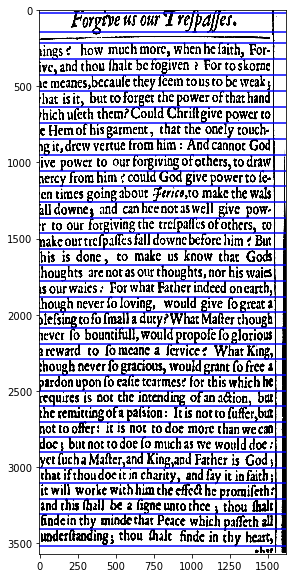

35
paine_99836404_177063_124height_meditationsanddisquisitions-034_page2r.tif
short: 8531256
long: 31928362


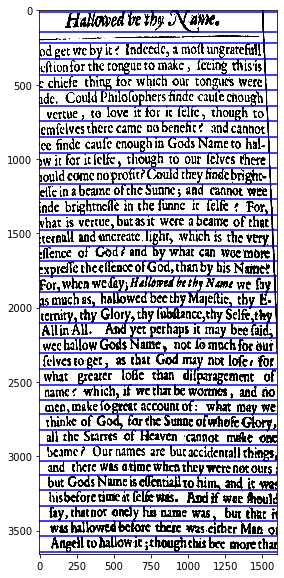

36
anon_9053941_42343_65height_treatiseofexecution-019_page1r.tif
short: 7132140
long: 23187746


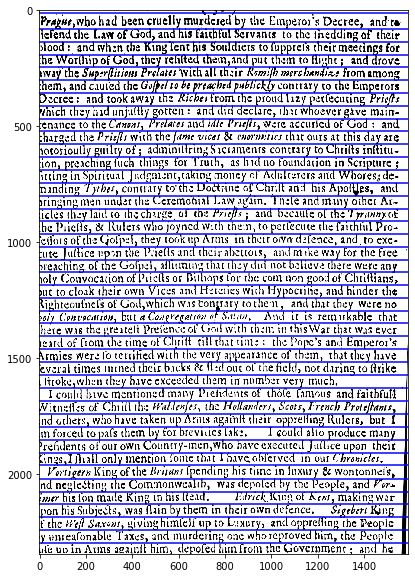

42
anon_11951455_51440_96height_atreatiseofdirection-036_page2r.tif
short: 3471223
long: 13072471


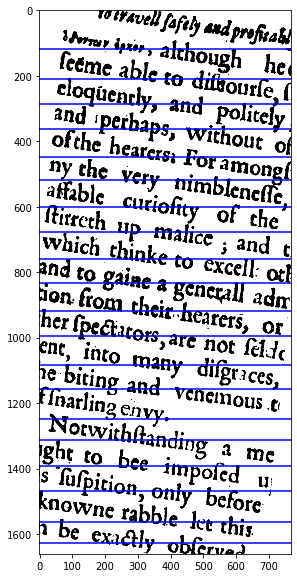

20
presbyteries-244_page1r.tif
short: 6939502
long: 49146563


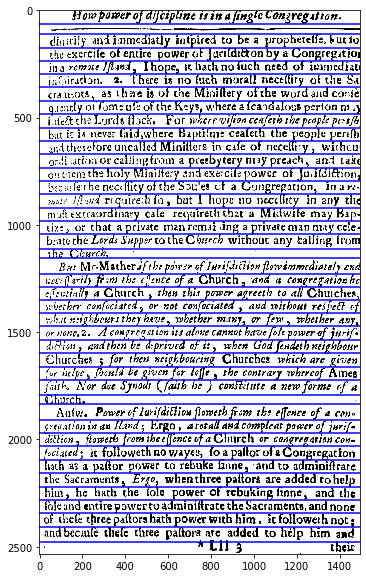

40
presbyteries-307_page2r.tif
short: 6615839
long: 68108360


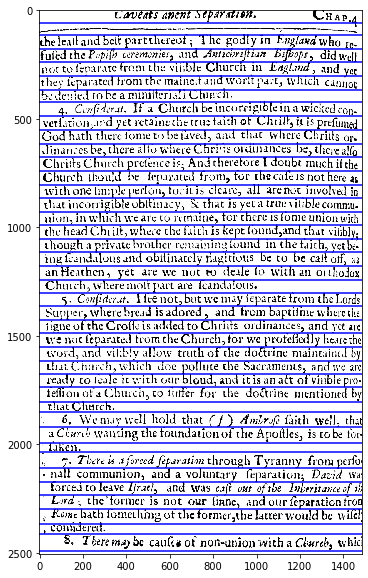

40
colasterion-015_page1r.tif
short: 18396064
long: 109901690


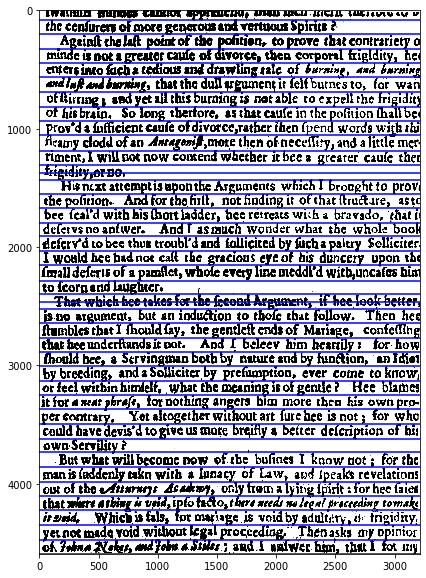

40
allde_99845053_9929_69height_catholikemoderator-047_page2r.tif
short: 3790759
long: 6219211


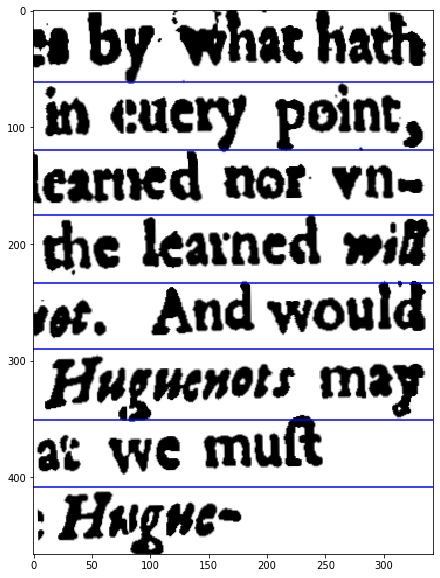

7
a.coe_99825981_207068_110height_briefandplaincatechisme-011_page1r.tif
short: 7216718
long: 37624107


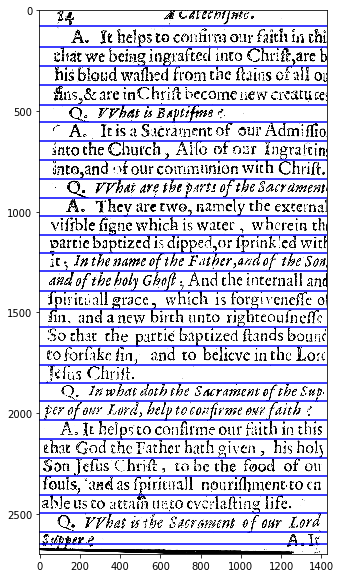

29
painesimmons_12302829_59172_68height_remedieofschisme-005_page2r.tif
short: 7049467
long: 29591511


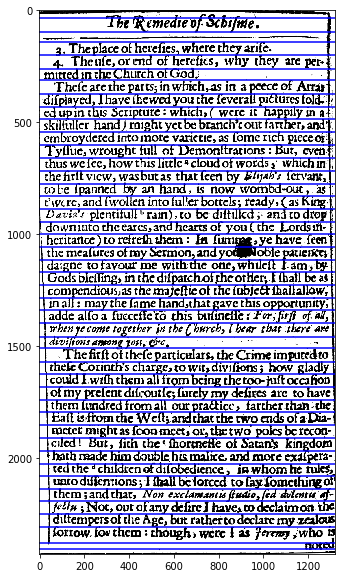

43
animadversions-030_page1r.tif
short: 9823401
long: 134730090


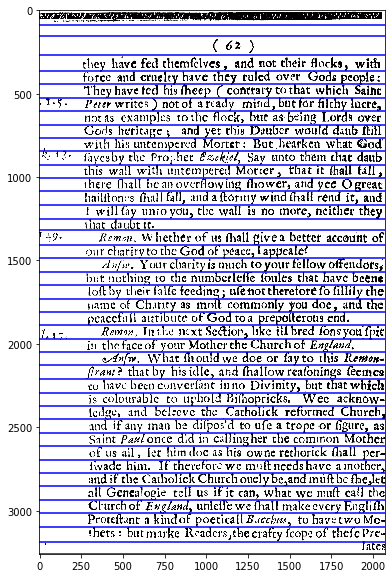

40
bloudytenent-139_page1r.tif
short: 7081606
long: 46179477


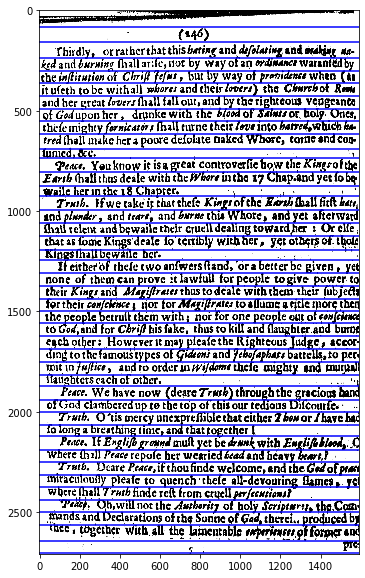

42
larner_99833819_38297_96height_observationsonhosea-007_page1r.tif
short: 7263054
long: 36930215


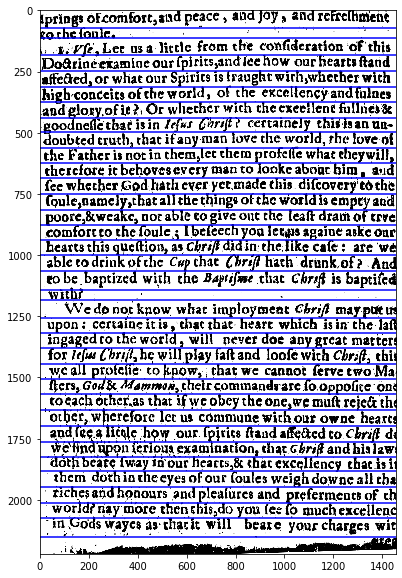

34
anon_45578517_172428_84height_bloudytenent2759D-002_page1r.tif
short: 10879818
long: 143027368


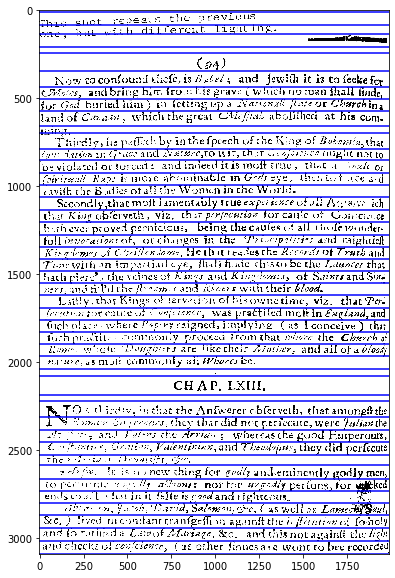

45
archbishop-004_page1r.tif
short: 9708417
long: 110279231


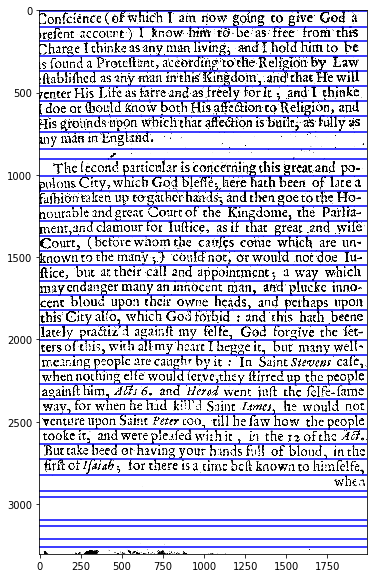

38
allde_99847664_12716_61height_bondman-037_page1r.tif
short: 7175260
long: 65776977


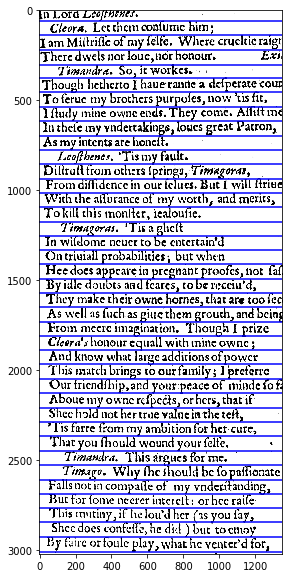

38
allde_56572951_181049_106height_logarithmes230637-036_page2r.tif
short: 3602007
long: 28604843


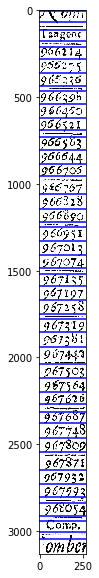

46
bloudytenent-005_page2r.tif
short: 9334982
long: 105328252


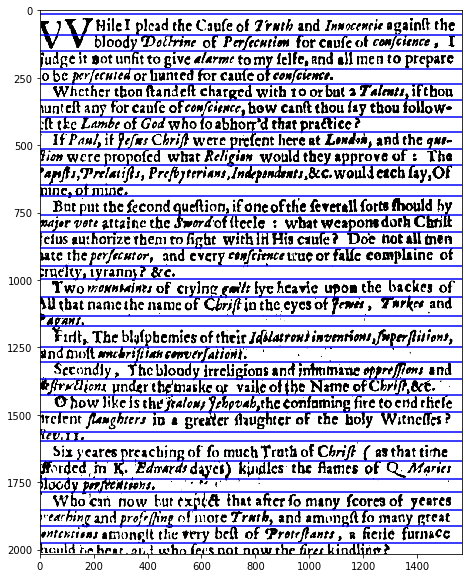

33
leviathanA-051_page1r.tif
short: 14364316
long: 135848699


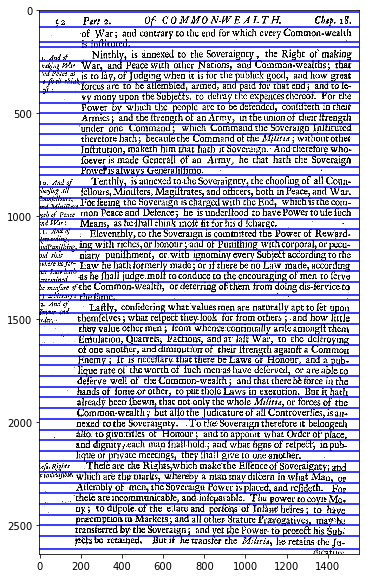

51
allde_99845053_9929_69height_catholikemoderator-037_page1r.tif
short: 6382635
long: 39529394


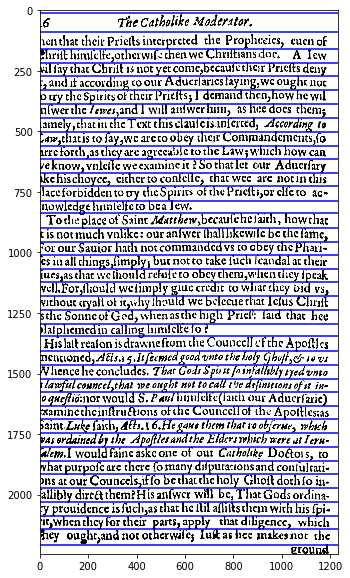

39
libertyofconscience1-013_page2r.tif
short: 7831573
long: 31217898


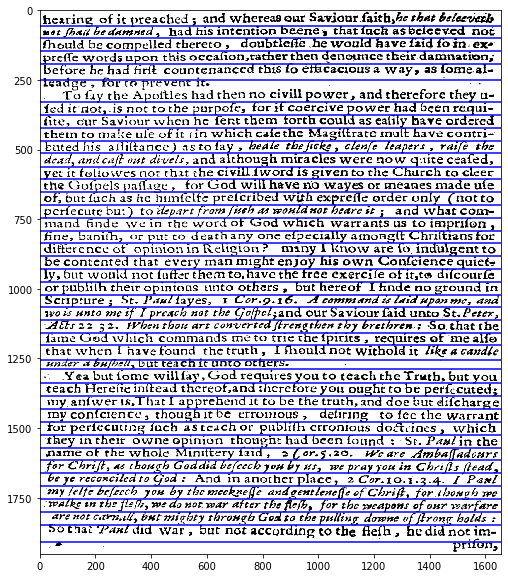

40
presbyteries-274_page2r.tif
short: 7194165
long: 40269591


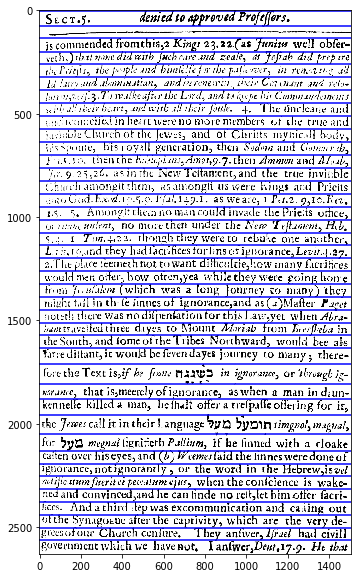

40
presbyteries-284_page1r.tif
short: 6868920
long: 57977734


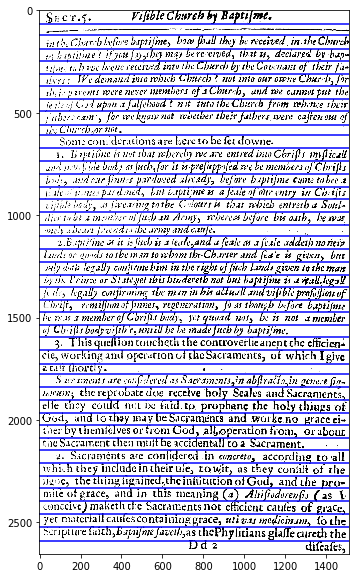

42
bloudytenent-023_page1r.tif
short: 10947324
long: 108164861


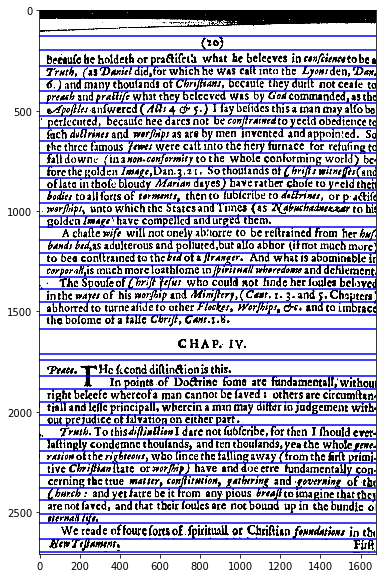

41
paine_44920427_173874_112height_sincereconvert-139_page1r.tif
short: 8941238
long: 47584451


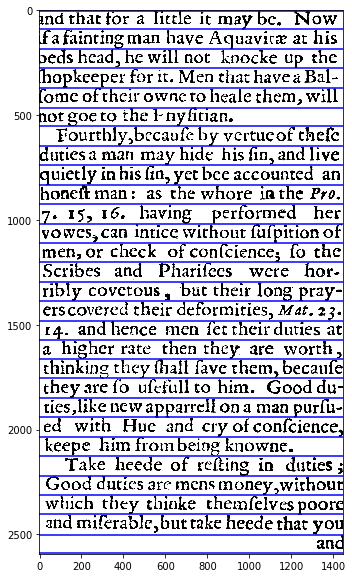

29
cotes_11901410_50587_53height_thepathway-014_page1r.tif
short: 6055695
long: 65448664


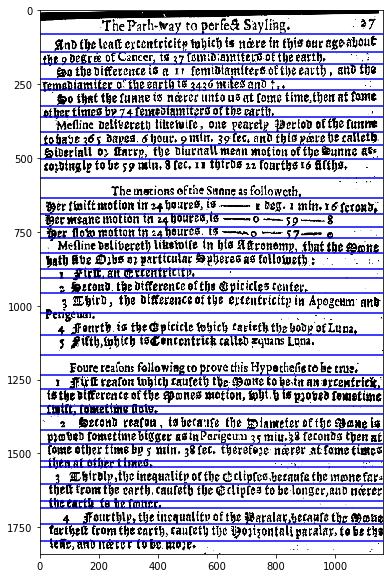

35
presbyteries-392_page2r.tif
short: 10518344
long: 56268981


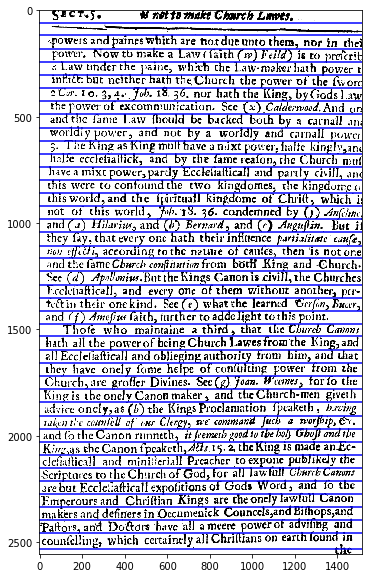

41
anon_14574607_102630_86height_compsam1ed-027_page1r.tif
short: 4834882
long: 27543365


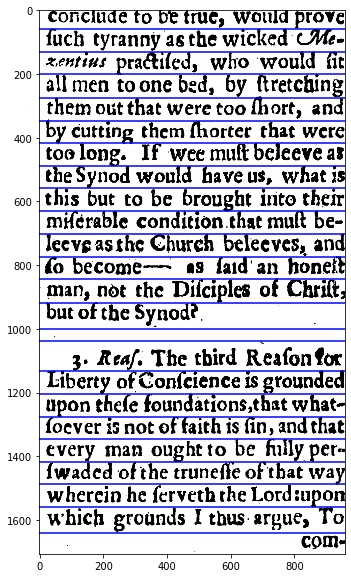

23
leviathanC-025_page2r.tif
short: 6735621
long: 43773935


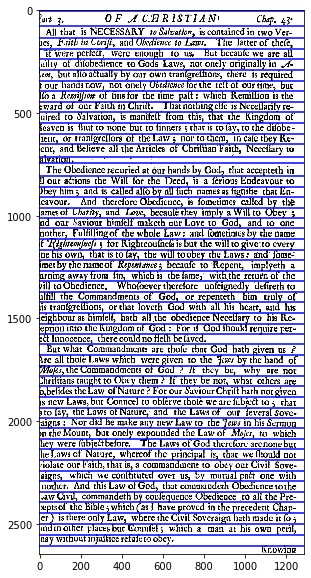

51
painesimmons_13031279_96743_68height_thetrueoriginal-013_page2r.tif
short: 2611893
long: 3218793


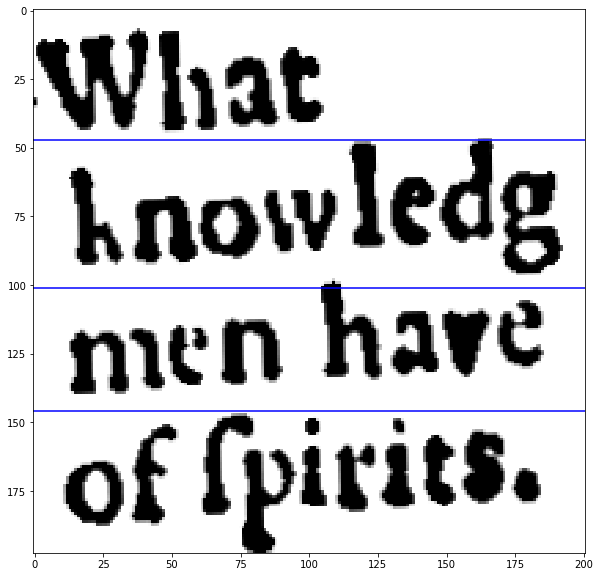

3
dugard_99832850_37325_71height_eikon-184_page2r.tif
short: 7762955
long: 70119811


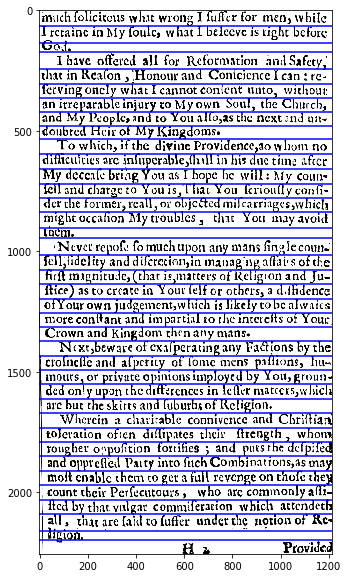

37
99
shortMean: 8498055.646464646
longMean: 61886680.4949495


In [8]:
#labelDir = "~/ERSPXMLData"
imageDir = "images"
count = 0
timeLong = []
timeShort = []
output_csv = open(os.path.join(imageDir, "timeStats.csv"), "w");
output_csv.write("File,Time\n")
for fileName in os.listdir(imageDir):
    if not fileName.endswith(".tif"):
        continue
    img = cv.imread(imageDir + "/" + fileName, 0)
    output_file = os.path.join(imageDir, fileName.replace(".tif", ".xml"))
    
#     root = et.Element(ROOT_TAG)
#     root.set(SCHEMA_LOCATION_ATTR, SCHEMA)
#     page = et.SubElement(root, PAGE_TAG, imageWidth=str(img.shape[1]),
#         imageHeight=str(img.shape[0]))
#     imageWidth = img.shape[1]
#     region = et.SubElement(page, TEXT_REGION_TAG)
    
    print(fileName)
        
    startTime = time.time_ns()
    foundTroughs = troughFind(img)
    endTime1 = time.time_ns()
    
    pixel_max = 255
    vert_cut_threshold = 0.25
    
    #inter_union_err = 0
    
    for i in np.arange(0, len(foundTroughs) - 1):
        start = foundTroughs[i]
        end = foundTroughs[i+1]
        #cutLine = img[start:end, :]
        vertSumList = np.sum(255 - img[start:end, :], 0)
        
        vertLength = len(vertSumList)
        first = next((i for i, val in enumerate(vertSumList) if val > (end-start) * pixel_max * vert_cut_threshold), None)
        if first is not None:
            last = next((j for j, val2 in enumerate(reversed(vertSumList)) if val2 > (end-start) * pixel_max * vert_cut_threshold), None)
        if last is not None:
            last = vertLength - last
            
        if first is None or last is None:
            #print("nothing larger than threshold")
            continue
        first, last = padding(first, last, vertLength)
        
    
            
#         top_left = str(first) + "," + str(foundTroughs[i])
#         top_right = str(last) + "," + str(foundTroughs[i])
#         bottom_right = str(last) + "," + \
#                 str(foundTroughs[i+1])
#         bottom_left = str(first) + "," + str(foundTroughs[i+1])

#         pointsAttr = top_left + " " + top_right + " " + bottom_right + \
#             " " + bottom_left
        
#         line = et.SubElement(region, TEXT_LINE_TAG)
#         et.SubElement(line, COORDS_TAG, points=pointsAttr)


#     tree = et.ElementTree(root)

#     try:
#         tree.write(output_file)
#     except FileNotFoundError:
#          print("Could not open " + output_file + " for writing. " + \
#                  "Line segmentation results not saved.")
#         continue
        
        
    endTime2 = time.time_ns()

    print("short: " + str(endTime1 - startTime))
    print("long: " + str(endTime2 - startTime))
    timeShort.append(endTime1 - startTime)
    
    output_csv.write(fileName.replace(".tif", ".xml") + "," + str(endTime2 - startTime) + "\n")
    timeLong.append(endTime2 - startTime)
    
    plt.figure(figsize=(20,10))
    plt.imshow(img, cmap="gray")
    for vl in foundTroughs:
        plt.axhline(y=vl, color="blue")
    plt.show()
    
    print(len(foundTroughs))
    
    count += 1
print(count)
output_csv.close()
print("shortMean: " + str(np.mean(timeShort)))
print("longMean: " + str(np.mean(timeLong)))